In [85]:
import pandas as pd
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.animation as animation
from scipy.integrate import odeint, solve_ivp
from scipy.stats import entropy
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from pathlib import Path
%matplotlib inline

## Poincare Recurrence in time-evolving RPS

Main function to simulate 3-strategy RPS with doubly evolving matrices. Uses odeint to integrate the differential equations and returns a dictionary that contains all necessary data.

In [2]:
P = np.matrix([ [0, -1, 1],
                [1, 0, -1],
                [-1, 1, 0] ])

In [11]:
import numpy
import scipy, scipy.integrate, scipy.optimize
import matplotlib

def RPSderiv(s,t,P,mu):
    """ Defines the ODE for time evolving RPS. 
    
    Parameters:
    s (array): Array-like of initial conditions [y1, y2, y3, w1, w2, w3]
    t (int): Time to integrate function over
    P (matrix): Standard RPS payoff matrix
    mu (float): Parameter for time evolving system
    
    Returns:
    array: concatenated derivatives of x and w
    """
    x = np.array([[s[0]], [s[1]], [s[2]]])
    w = np.array([[s[3]], [s[4]], [s[5]]])

    A = np.matrix([ [0, (x[1][0]-x[0][0]), (x[2][0]-x[0][0])],
                    [(x[0][0]-x[1][0]), 0, (x[2][0]-x[1][0])],
                    [(x[0][0]-x[2][0]), (x[1][0]-x[2][0]), 0] ])
    B = np.matrix([ [0, (w[0][0]-w[1][0]), (w[0][0]-w[2][0])],
                     [(w[1][0]-w[0][0]), 0, (w[1][0]-w[2][0])],
                     [(w[2][0]-w[0][0]), (w[2][0]-w[1][0]), 0] ])
    Pw = P + mu*B
    dxdt = np.multiply(x, np.matmul(Pw, x)-x.T@Pw@x).flatten().tolist()[0]
    dwdt = np.multiply(w, A@w - w.T@A@w).flatten().tolist()[0]
    
    return np.array(dxdt+dwdt)

def RPSTrajectory(f=RPSderiv, s=[0.1, 0.3, 0.6, 0.1, 0.3, 0.6],
    timestep=0.1, numstep=2000, mu=0.1, P=P) :
    """ Runs ODEint for the RPS system
    
    Parameters:
    s (array): Array-like of initial conditions [x1, x2, x3, w1, w2, w3]
    timestep (float): Timestep of each iteration of the integration
    numstep (int): Number of iterations to be performed
    P (matrix): Standard RPS payoff matrix
    mu (float): Parameter for time evolving system
    
    Returns: 
    dict: Keys are (times, x1, x2, x3, w1, w2, w3)
    The values associated with the keys are time series.
    """
    partuple=(P, mu)        # Converts parameters to a tuple in the right order
    tvals=numpy.arange(numstep)*timestep
    traj=scipy.integrate.odeint(f,s,tvals,partuple)
    # Store the results of odeint in a dictionary
    data={}
    data["times"]=tvals
    data["y1"]=traj[:,0]
    data["y2"]=traj[:,1]
    data["y3"]=traj[:,2]
    data["w1"]=traj[:,3]
    data["w2"]=traj[:,4]
    data["w3"]=traj[:,5]
    return data

Run the function to get data for plotting

In [12]:
s1=[0.1, 0.2, 0.7, 0.7, 0.2, 0.1]
data = RPSTrajectory(s=s1, f=RPSderiv, numstep=10000)

### Plot phase portraits

In [15]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np

x = data['y1']
y = data['y2']
z = data['y3']

fig = go.Figure(data=go.Scatter3d(x=x, y=y, z=z, marker=dict(size=2,color=z,colorscale='viridis',),
                                  line=dict(color='darkblue',width=1), showlegend=False))

p1=[1, 0, 0, 1]
p2=[0, 1, 0, 0]
p3=[0, 0, 1, 0]

fig.add_trace(go.Scatter3d(x=p1, y=p2, z=p3, marker=dict(size=2, color='black',),
                           line=dict(color='black', width=2),showlegend=False))

In [128]:
x2 = data['w1']
y2 = data['w2']
z2 = data['w3']


fig1 = go.Figure(data=go.Scatter3d(x=x2, y=y2, z=z2, marker=dict(size=2, color=z, colorscale='agsunset',),
                                   line=dict(color='darkblue',width=1), showlegend=False))

p1=[1, 0, 0, 1]
p2=[0, 1, 0, 0]
p3=[0, 0, 1, 0]

fig1.add_trace(go.Scatter3d(x=p1, y=p2, z=p3, marker=dict(size=2,color='black',),
                            line=dict(color='black',width=2),showlegend=False))



## Constant Weighted Sum of KL-Divergence

The system exhibits a constant of motion, which indicates that volume preservation holds in the system.

In [18]:
data_y = np.array([data[i] for i in ['y1', 'y2', 'y3']]).T
data_w = np.array([data[i].T for i in ['w1', 'w2', 'w3']]).T

In [20]:
div_y = []
for i in data_y:
    kl_div_y = entropy([1/3, 1/3, 1/3], qk=i)
    div_y.append(kl_div_y)

y_weighted = [y for y in div_y]

div_w = []
for i in data_w:
    kl_div_w = entropy([1/3, 1/3, 1/3], qk=i)
    div_w.append(kl_div_w)

w_weighted = [0.1*w for w in div_w]

div_combined = np.add(w_weighted, y_weighted)

In [21]:
fig = go.Figure([go.Scatter(y=y_weighted[:1000],
                    mode='lines', line=dict(width=0.5, color='rgb(131, 90, 241)'),
                    name='Weighted y', fill='tozeroy'), 
                 go.Scatter(y=div_combined[:1000],
                    mode='lines',
                    name='Weighted w', line=dict(width=0.5, color='rgb(111, 231, 219)'), fill='tonexty'),
                 go.Scatter(y=div_combined[:1000],
                    mode='lines',
                    name='Sum of Divergences', line = dict(width = 4),opacity=1)
                ])

# Edit layout
fig.update_layout(xaxis_title='Time Steps',
                   yaxis_title='KL-Divergence')


## 5 node zero-sum polymatrix game

General form (using matrix multiplication) of the time evolving RPS setting. We use this to show that even for complex systems, the volume preservation property holds. 

N.B.: the integrator fails after (on average) 1000 time steps or so, most likely due to numerical errors.

In [35]:
def RPSderiv5node(s,t,P,mu):
    """ Defines the ODE for time evolving RPS (5 node). 
    
    Parameters:
    s (array): Array-like of initial conditions [y1, y2, y3, w1, w2, w3]
    t (int): Time to integrate function over
    P (matrix): Standard RPS payoff matrix
    mu (float): Parameter for time evolving system
    
    Returns:
    array: concatenated derivatives of x and w
    """
    x1 = np.array([[s[0]], [s[1]], [s[2]]])
    x2 = np.array([[s[3]], [s[4]], [s[5]]])
    x3 = np.array([[s[6]], [s[7]], [s[8]]])
    x4 = np.array([[s[9]], [s[10]], [s[11]]])
    x5 = np.array([[s[12]], [s[13]], [s[14]]])

    mu1, mu2, mu3, mu4, mu5 = mu
    
    I = np.matrix([[1., 0., 0.], 
                   [0., 1., 0.], 
                   [0., 0., 1.]])
    
    P = np.matrix([[0., -1., 1.],
                   [1., 0., -1.],
                   [-1., 1., 0.] ])
    
    dx1dt = np.multiply(x1, 
                        (((P @ x1) + ((mu1*I) @ x2))-
                         (x1.transpose()@((P@x1) + ((mu1*I) @ x2))) )).flatten().tolist()[0]
    dx2dt = np.multiply(x2, 
                        ((((mu2*I) @ x3)+(-I @ x1))-
                         (x2.transpose()@(((mu2*I) @ x3)+(-I @ x1))) )).flatten().tolist()[0]
    dx3dt = np.multiply(x3, 
                        (((P @ x3) + (-I @ x2)+((mu3*I) @ x4))-
                         (x3.transpose()@((P @ x3) + (-I @ x2)+((mu3*I) @ x4))) )).flatten().tolist()[0]
    dx4dt = np.multiply(x4, 
                        ((((mu4*I) @ x5)+(-I @ x3))-
                         (x4.transpose()@(((mu4*I) @ x5)+(-I @ x3))) )).flatten().tolist()[0]
    dx5dt = np.multiply(x5, 
                        (((P @ x5) + (-I @ x4))-
                         (x5.transpose()@((P @ x5) +(-I @ x4))) )).flatten().tolist()[0]

    return np.array(dx1dt+dx2dt+dx3dt+dx4dt+dx5dt)

def RPSTrajectory5node(s, f=RPSderiv5node,
    timestep=0.1, numstep=1000, mu=0.1, P=P) :
    """ Runs ODEint for the RPS system
    
    Parameters:
    s (array): Array-like of initial conditions [x1, x2, x3, w1, w2, w3]
    timestep (float): Timestep of each iteration of the integration
    numstep (int): Number of iterations to be performed
    P (matrix): Standard RPS payoff matrix
    mu (float): Parameter for time evolving system
    
    Returns: 
    dict: Keys are (times, x1, x2, x3, w1, w2, w3)
    The values associated with the keys are time series.
    """
    partuple=(P, mu)        # Converts parameters to a tuple in the right order
    tvals=numpy.arange(numstep)*timestep
    traj=scipy.integrate.odeint(f,s,tvals,partuple)

    # Store the results of odeint in a dictionary
    data={}
    data["times"]=tvals
    data["x1"] = traj[:,:3]
    data["x2"] = traj[:,3:6]
    data["x3"] = traj[:,6:9]
    data["x4"] = traj[:,9:12]
    data["x5"] = traj[:,12:15]
    return data

Get data for a 5-node polymatrix RPS-like game. For this section, $x_i$ is a matrix with 3 columns representing the RPS strategies of agent $i$. 

In [39]:
s2 = [0.3, 0.4, 0.3, 0.2, 0.1, 0.7, 0.5, 0.3, 0.2, 0.7, 0.2, 0.1, 0.4, 0.2, 0.4]
mu2 = [0.1, 0.5, 0.8, 0.5, 0.1]
data_5node = RPSTrajectory5node(s=s2, numstep=1000, f=RPSderiv5node, mu=mu2)

15


We use the scipy entropy function to compute the KL-divergence of these strategies from the Nash equilibrium.

In [44]:
div_x1 = []
for i in data_5node['x1']:
    kl_div_x1 = entropy([1/3, 1/3, 1/3], qk=i)
    div_x1.append(kl_div_x1)

x1_weighted = np.array([x for x in div_x1])

div_x2 = []
for i in data_5node['x2']:
    kl_div_x2 = entropy([1/3, 1/3, 1/3], qk=i)
    div_x2.append(kl_div_x2)

x2_weighted = np.array([0.1*x for x in div_x2])

div_x3 = []
for i in data_5node['x3']:
    kl_div_x3 = entropy([1/3, 1/3, 1/3], qk=i)
    div_x3.append(kl_div_x3)
    
x3_weighted = np.array([0.05*x for x in div_x3])
                    
div_x4 = []
for i in data_5node['x4']:
    kl_div_x4 = entropy([1/3, 1/3, 1/3], qk=i)
    div_x4.append(kl_div_x4)

x4_weighted = np.array([0.04*x for x in div_x4])

div_x5 = []
for i in data_5node['x5']:
    kl_div_x5 = entropy([1/3, 1/3, 1/3], qk=i)
    div_x5.append(kl_div_x5)

x5_weighted = np.array([0.02*x for x in div_x5])

div_combined = x1_weighted+x2_weighted+x3_weighted+x4_weighted+x5_weighted

In [129]:
import plotly.graph_objects as go
fig = go.Figure([go.Scatter(y=x1_weighted,
                    mode='lines', line=dict(width=0.5, color='#fde725'),
                    name='S1', fill='tozeroy'), 
                 go.Scatter(y=x1_weighted+x2_weighted, mode='lines',
                    name='S2', line=dict(width=0.5, color='#6ece58'), fill='tonexty'),
                go.Scatter(y=x1_weighted+x2_weighted+x3_weighted, mode='lines',
                    name='S3', line=dict(width=0.5, color='#4a69bb'), fill='tonexty'),
                 go.Scatter(y=x1_weighted+x2_weighted+x3_weighted+x4_weighted, mode='lines',
                    name='S4', line=dict(width=0.5, color='#ff7315'), fill='tonexty'),
                 go.Scatter(y=x1_weighted+x2_weighted+x3_weighted+x4_weighted+x5_weighted, mode='lines',
                    name='S5', line=dict(width=0.5, color='#fe346e'),opacity=1, fill='tonexty'),
                 go.Scatter(y=div_combined,
                    mode='lines',
                    name='Sum of Divergences', line = dict(width = 3, color='#440154'),opacity=1)
                ])

# Edit layout
fig.update_layout(xaxis_title='Time Steps',
                  yaxis_title='KL-Divergence', 
                  legend_orientation='h', 
                  legend=dict( y=-0.2),
                  font=dict(size=20))


## Poincare Sections

[Insert description about P sections]

#### 2D Poincare Sections

In [64]:
mu_2 = 0.8
step = .001
num = 4000000
psectiondata = []
for i in range(1, 10+1):
    init = np.array([0.5, 0.01*i, 0.5-0.01*i, 0.5, 0.25, 0.25])
    t_span = (0, num*step)
    t_eval = np.arange(num)*step

#     sol = solve_ivp(RPSderiv, t_span, init, method='RK45', t_eval=t_eval, rtol=1e-8, args=[P, mu])
#     traj = sol.y.T    
    partuple=(P, mu_2)        # Converts parameters to a tuple in the right order
#     tvals=numpy.arange(numstep)*timestep
    traj=scipy.integrate.odeint(RPSderiv,init,t_eval,partuple)
    
    stat = traj[:, 1]-traj[:, 0] + traj[:, 4] - traj[:, 3]
    idx = np.where((stat[1:]*stat[:-1]<0)&(stat[1:]<0))[0] 
#     idx = np.where((stat[1:]*stat[:-1]<0)&(stat[1:]>0))[0] 
#     idx = np.where((stat[1:]*stat[:-1]<0))[0] 
    psectiondata.append((traj[idx, 0], traj[idx, 4]))

<Figure size 1440x1296 with 0 Axes>

Text(0.5, 0, '$x_1$')

Text(0, 0.5, '$w_2$')

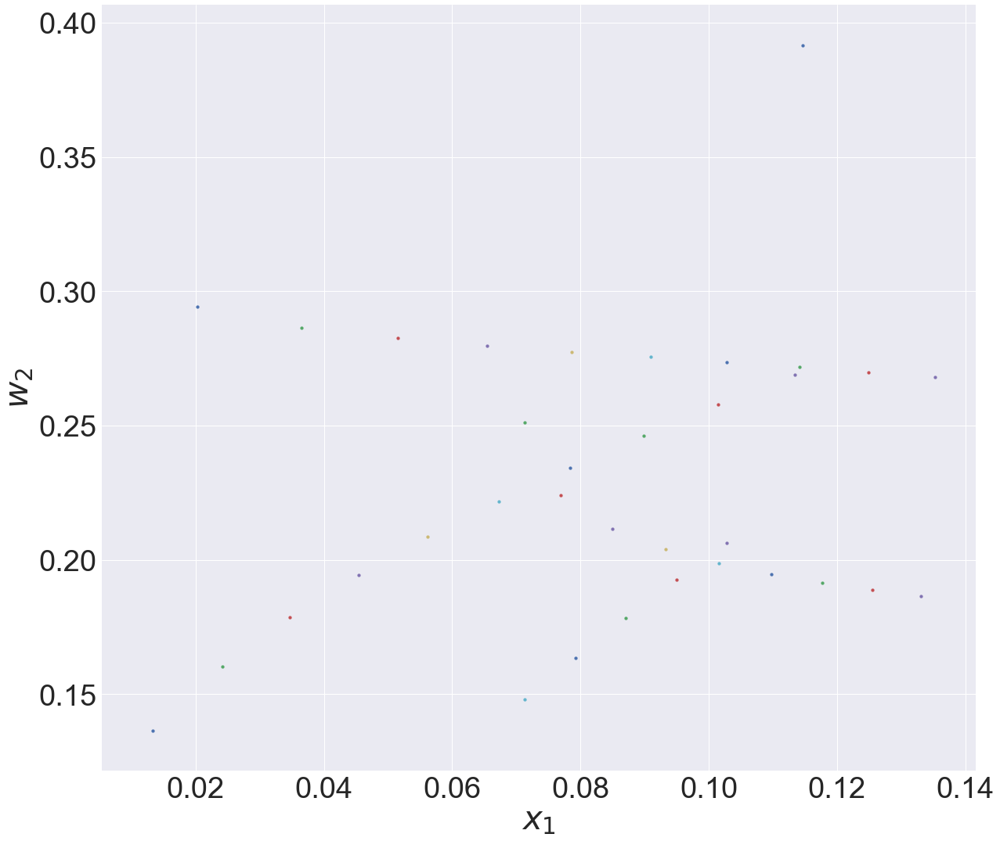

In [65]:
plt.figure(figsize=(20, 18))
plt.style.use('seaborn')
for data_point in psectiondata:
#     plt.scatter(data_point[0], data_point[1], s=10, color='black')
    plt.scatter(data_point[0], data_point[1], s=15)
# plt.savefig('eps0.png')
# plt.xlim(.2, .6)
# plt.ylim(.2, .6)
plt.xlabel(r'$x_1$', fontsize=42)
plt.ylabel(r'$w_2$', fontsize=42)
plt.tick_params(axis='x', labelsize=38)
plt.tick_params(axis='y', labelsize=38)


#### 3D Poincare Sections

In [66]:
def GetRPSPoincare(data):
    """ Generates a Poincare section:
    plots y1 vs w2 when y2+y1+w2+w1=4/3 and w1>1/3.
    
    Parameters:
    data (dict): Dictionary containing time series data from RPS simulations
    
    Returns:
    signchangeloc: array of locations where a hyperplane passes through 0
    
    """
    #unpack data
    #NOTE: here we used hyperplane x2-x1-w2+w1=0
    tester = (data["y2"]+data["y1"])+(data["w2"]+data["w1"])-4/3
    x1=data["y1"]
    x2=data["y2"]
    x3=data["y3"]
    w1=data["w1"]
    w2=data["w2"]
    w3=data["w3"]
    t=data["times"]
    
    #get indices where the hyperplane is zero and the trajectories pass through the hyperplane
    xsignprod = (tester[:-1]*tester[1:]<0)&(tester[:-1]>0)#&(w1[1:] > 1/3)
#     xsignprod = (tester[1:]<(4/3))#&(tester[:-1]*tester[1:]>(4/3)-0.01)#&(x1[1:]<0.15)&(w3[1:]>0.2)
#     xsignprod = (tester<(4/3)+0.01)&(tester>(4/3)-0.01)
    signchangeloc=numpy.where(xsignprod)[0]
    data['signchangeloc'] = signchangeloc
    data['y1dat'] = x1[signchangeloc]
    data['y2dat'] = x2[signchangeloc]
    data['y3dat'] = x3[signchangeloc]
    data['w1dat'] = w1[signchangeloc]
    data['w2dat'] = w2[signchangeloc]
    data['w3dat'] = w3[signchangeloc]
    print('Poincare section data generated')
#     print(len(signchangeloc))
#     #interpolate between these bracketed times to find x2 and w2 at those times.
#     x2dat=numpy.array([lininterp(xvals=(x1[s],x1[s+1]),yvals=(x2[s],x2[s+1])) for s in signchangeloc])
#     w2dat=numpy.array([lininterp(xvals=(x1[s],x1[s+1]),yvals=(w2[s],w2[s+1])) for s in signchangeloc])

    return data

def lininterp(xvals,yvals):
    """ Take (x0,y0) and (x1,y1) to be points defining a line
    finds the value of y when x=0
    
    Parameters:
    xvals, yvals (tuples) : x and y values to interpolate between
    """
    return (xvals[1]*yvals[0]-xvals[0]*yvals[1])/(xvals[1]-xvals[0])

In [67]:
def GetIteratedPoincare(numiters=25, numstep=10000, timestep=0.1,mu=0.1, agents_to_plot=['x1', 'x2', 'w1']):
    '''Runs a defined number of iterations of the GetRPSPoincare function, and adds relevant data to the data dictionary.
    
    Parameters:
    numiters (int): Number of iterations to run the simulation. Note that due to the defined initial conditions, the maximum number of iterations is 50
    numstep (int): Number of steps to run the RPS simulation for each iteration
    timestep (float): Timestep of each iteration of the integration
    agents_to_plot (array-like): 3 of the agents in the form [X, Y, Z]. These 3 agents will be saved in the output, which can then be plotted in a 3D graph
    
    Returns:
    data (dict): Updated dictionary that includes Poincare section data for the agents defined
    
    '''
    if numiters>50:
        print('Maximum iterations is 50!')
        return
    
    data=dict()
    k = np.linspace(1, numiters, num=numiters)
    poincare_data_x = []
    poincare_data_y = []
    poincare_data_z = []
    for i in k:
        print("Iteration: {}".format(int(i)))
#         init = [0.5, 0.01*i, 0.5-0.01*i, 0.5, 0.25, 0.25]
        init = [1/3, 0.03*i, 2/3-0.03*i, 1/3, 1/3, 1/3]
        data_i = RPSTrajectory(s=init, numstep=numstep, timestep=timestep, mu=mu)
        poincare = GetRPSPoincare(data_i)
        poincare_data_x.append(poincare[agents_to_plot[0]+'dat'])
        poincare_data_y.append(poincare[agents_to_plot[1]+'dat'])
        poincare_data_z.append(poincare[agents_to_plot[2]+'dat'])
#     plt.plot(poincare[1], poincare[2], color='black')
        plt.scatter(poincare[agents_to_plot[0]+'dat'], poincare[agents_to_plot[1]+'dat'], s=1)
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     ax.scatter(poincare[1],poincare[2], poincare[3])
    data['poincare_data_x'] = poincare_data_x
    data['poincare_data_y'] = poincare_data_y
    data['poincare_data_z'] = poincare_data_z
    data['agents_to_plot'] = agents_to_plot
    return data

Iteration: 1
Poincare section data generated
Iteration: 2
Poincare section data generated
Iteration: 3
Poincare section data generated
Iteration: 4
Poincare section data generated
Iteration: 5
Poincare section data generated
Iteration: 6
Poincare section data generated
Iteration: 7
Poincare section data generated
Iteration: 8
Poincare section data generated
Iteration: 9
Poincare section data generated
Iteration: 10
Poincare section data generated


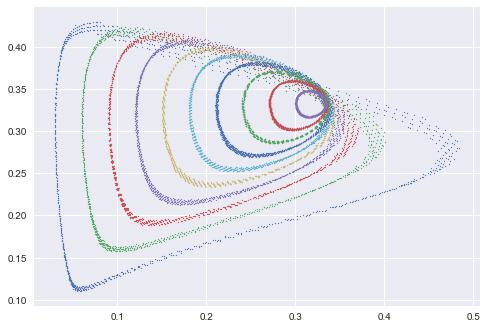

In [68]:
poincare_data = GetIteratedPoincare(numiters=10, numstep=100000, mu=0.8, agents_to_plot=['y1', 'w2', 'w3'])

In [69]:
import itertools
#combining all iterations of each agent in one big list (we don't really need to care which iteration gives the relevant data)
poincare_data_x_joined = list(itertools.chain.from_iterable(poincare_data['poincare_data_x']))
poincare_data_y_joined = list(itertools.chain.from_iterable(poincare_data['poincare_data_y']))
poincare_data_z_joined = list(itertools.chain.from_iterable(poincare_data['poincare_data_z']))

In [70]:
z1 = np.arange(0,10, 1)  


traces =  [go.Scatter3d(x=poincare_data['poincare_data_x'][k], y=poincare_data['poincare_data_y'][k], z=poincare_data['poincare_data_z'][k], mode='markers',
                              marker=dict(size=1.5),)
           for k in z1]

layout = go.Layout(width=900,
                   height=700,
                   autosize=False,
                   showlegend=False, 
#                    scene_aspectmode='cube',
                   scene= dict(
                       xaxis=dict(title= poincare_data['agents_to_plot'][0]),
                       yaxis=dict(title= poincare_data['agents_to_plot'][1]),
                       zaxis=dict(title= poincare_data['agents_to_plot'][2]),
                       aspectratio=dict(x=1, y=1, z=0.5))
    
                  )

fig = go.Figure(data= traces, layout=layout)
fig.show()

## Time Average Convergence

In [73]:
def run_rps(vec, time, f, P, mu):

    t = np.arange(time)*.01
    results = odeint(f, vec, t, args=(P, mu))
    
    return results

In [81]:
x_regret = []
w_regret = []

x_regret_loop = []
w_regret_loop = []


num_init = 10
#initial_conditions = []
entropies = []

N=10
x1_inits = np.linspace(0.1,0.7, N)
x = np.asarray([[x1, 0.75-x1, 0.25] for x1 in x1_inits])
w=np.random.rand(10,3)
initial_conditions=np.hstack((x,w)) #.append([x,w])
wutilities=[]
xutilities=[]
xvalstime=[]
wvals1=[];  wvals2=[]; wvals3=[]
xvals1=[];  xvals2=[]; xvals3=[]
for x0 in initial_conditions:
    x=x0[0:3]
    w=x0[3:6]

    x = x/x.sum()
    w = w/w.sum()
    vec = np.concatenate([x, w])
    
    print('Initial Conditions: ', vec)

    time = 20000
    mu = 0.8
    rpsdata = run_rps(vec, time=time, f=RPSderiv, P=P, mu=mu)
    A = mu*np.eye(3)
    B = -np.eye(3)

    utility = []

    x1s=[]; x2s=[]; x3s=[] # local storage
    for i in range(len(rpsdata)):
        regret = ((np.array([1/3,1/3,1/3])@A@np.array([1/3,1/3,1/3])+np.array([1/3,1/3,1/3])@P@np.array([1/3,1/3,1/3]) 
                   - rpsdata[i, :3]@A@rpsdata[i, 3:]  - rpsdata[i, :3]@P@rpsdata[i, :3]).item())
        xval = (rpsdata[i, :3])
        utility.append(regret)
        x1s.append(xval[0])
        x2s.append(xval[1])
        x3s.append(xval[2])
    xutilities.append(utility)
    xvals1.append(x1s)
    xvals2.append(x2s)
    xvals3.append(x3s)


    x_regret_loop.append(utility)

    utility = []

    w1s=[]; w2s=[]; w3s=[]
    for i in range(len(rpsdata)):
        regret = (np.array([1/3,1/3,1/3])@B@np.array([1/3,1/3,1/3])- rpsdata[i, :3]@B@rpsdata[i, 3:]).item()
        utility.append(regret)
        wval = (rpsdata[i, 3:])

        w1s.append(wval[0])
        w2s.append(wval[1])
        w3s.append(wval[2])

    wvals1.append(w1s)
    wvals2.append(w2s)
    wvals3.append(w3s)

    w_regret_loop.append(utility)
    wutilities.append(utility)

cumsums=[]
for utilval in xutilities:
    cumsums.append(np.cumsum(utilval)/np.arange(1, len(utilval)+1))
cumsumsw=[]
for utilval in wutilities:
    cumsumsw.append(np.cumsum(utilval)/np.arange(1, len(utilval)+1))
    
cxvals1=[]
for xvalit in xvals1:
    cxvals1.append(np.cumsum(xvalit)/np.arange(1, len(xvalit)+1))
    
cxvals2=[]
for xvalit in xvals2:
    cxvals2.append(np.cumsum(xvalit)/np.arange(1, len(xvalit)+1))
    
cxvals3=[]
for xvalit in xvals3:
    cxvals3.append(np.cumsum(xvalit)/np.arange(1, len(xvalit)+1))
    
cwvals1=[]
for utilval in wvals1:
    cwvals1.append(np.cumsum(utilval)/np.arange(1, len(utilval)+1))
    
cwvals2=[]
for utilval in wvals2:
    cwvals2.append(np.cumsum(utilval)/np.arange(1, len(utilval)+1))
    
cwvals3=[]
for utilval in wvals3:
    cwvals3.append(np.cumsum(utilval)/np.arange(1, len(utilval)+1))

Initial Conditions:  [0.1        0.65       0.25       0.43717636 0.41102415 0.1517995 ]
Initial Conditions:  [0.16666667 0.58333333 0.25       0.53670737 0.16553824 0.29775439]
Initial Conditions:  [0.23333333 0.51666667 0.25       0.6399748  0.00628728 0.35373792]
Initial Conditions:  [0.3        0.45       0.25       0.39823458 0.52696547 0.07479996]
Initial Conditions:  [0.36666667 0.38333333 0.25       0.15179407 0.4442861  0.40391983]
Initial Conditions:  [0.43333333 0.31666667 0.25       0.17010856 0.09988845 0.73000298]
Initial Conditions:  [0.5        0.25       0.25       0.54207866 0.38828676 0.06963458]
Initial Conditions:  [0.56666667 0.18333333 0.25       0.19114505 0.79798251 0.01087243]
Initial Conditions:  [0.63333333 0.11666667 0.25       0.1041537  0.45101419 0.44483212]
Initial Conditions:  [0.7        0.05       0.25       0.3602372  0.29940769 0.34035511]


<Figure size 720x576 with 0 Axes>

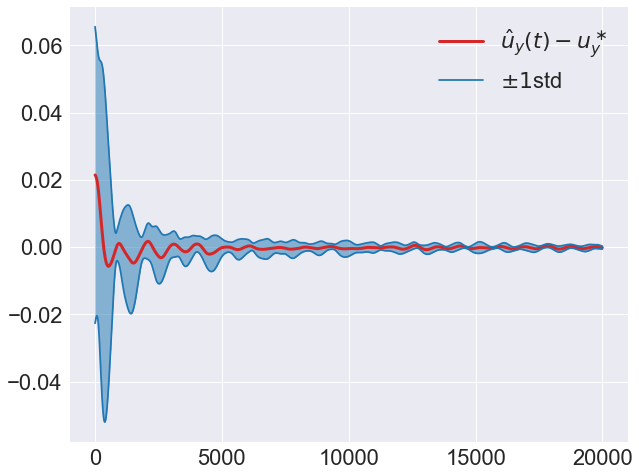

In [82]:
uxmeans=np.mean(np.asarray(cumsums),axis=0)
uxvars=np.std(np.asarray(cumsums),axis=0)

uwmeans=np.mean(np.asarray(cumsumsw),axis=0)
uwvars=np.std(np.asarray(cumsumsw),axis=0)

plt.figure(figsize=(10,8))
plt.plot(uxmeans, color='tab:red', linewidth=3, label=r'$\hat{u}_y(t)-u_y^\ast$')
plt.plot(uxmeans+uxvars,color='tab:blue', label=r'$\pm 1$std')
plt.plot(uxmeans-uxvars,color='tab:blue')

plt.fill_between(np.arange(0,20000),uxmeans-uxvars,uxmeans+uxvars,color='tab:blue', alpha=0.5)

plt.tick_params(labelsize=22)
plt.legend(fontsize=22)
#plt.title(r'Time Average Utility ($x$-player)', fontsize=22)
# plt.savefig('timeavgutility_new.png', dpi=600,bbox_inches='tight') #,transparent=True)

<Figure size 720x576 with 0 Axes>

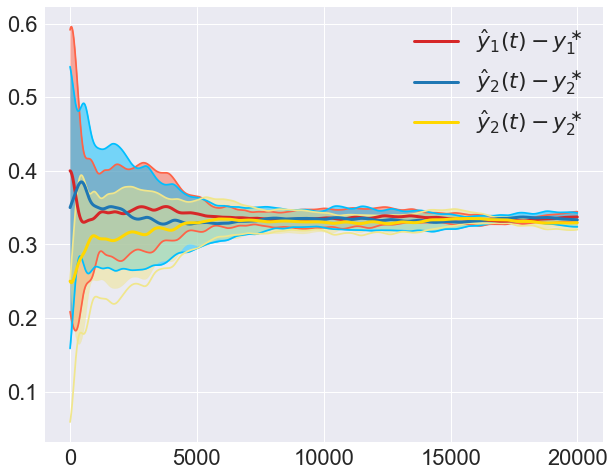

In [83]:
# import seaborn as sns
# sns.set_style("darkgrid")
xmeans1=np.mean(np.asarray(cxvals1),axis=0)
xvars1=np.std(np.asarray(cxvals1),axis=0)
xmeans2=np.mean(np.asarray(cxvals2),axis=0)
xvars2=np.std(np.asarray(cxvals2),axis=0)
xmeans3=np.mean(np.asarray(cxvals3),axis=0)
xvars3=np.std(np.asarray(cxvals3),axis=0)
x1col='tomato'
plt.figure(figsize=(10,8))
#plt.plot(xmeans1, color='tab:red', linewidth=3, label=r'$\hat{x}_1(t)-x_1^\ast$')
plt.plot(xmeans1+xvars1,color=x1col) # label=r'$\pm 1$std')
plt.plot(xmeans1-xvars1,color=x1col)
plt.fill_between(np.arange(0,20000),xmeans1-xvars1,xmeans1+xvars1,color=x1col, alpha=0.5)

x2col='deepskyblue'
#plt.plot(xmeans2, color='tab:blue', linewidth=3, label=r'$\hat{x}_2(t)-x_2^\ast$')
plt.plot(xmeans2+xvars2,color=x2col)
plt.plot(xmeans2-xvars2,color=x2col)
plt.fill_between(np.arange(0,20000),xmeans2-xvars2,xmeans2+xvars2,color=x2col, alpha=0.5)

x3col='khaki'

plt.plot(xmeans3+xvars3,color=x3col)
plt.plot(xmeans3-xvars2,color=x3col)
plt.fill_between(np.arange(0,20000),xmeans3-xvars3,xmeans3+xvars3,color=x3col, alpha=0.5)

plt.plot(xmeans1, color='tab:red', linewidth=3, label=r'$\hat{y}_1(t)-y_1^\ast$')
plt.plot(xmeans2, color='tab:blue', linewidth=3, label=r'$\hat{y}_2(t)-y_2^\ast$')
plt.plot(xmeans3, color='gold', linewidth=3, label=r'$\hat{y}_2(t)-y_2^\ast$')
#plt.plot(wmeans, color='tab:orange', linewidth=3, label=r'$\hat{u}_w(t)-u_w^\ast$')
#plt.plot(wmeans+wvars,color='yellow', label=r'$\pm 1$std')
#plt.plot(wmeans-wvars,color='yellow')

#plt.fill_between(np.arange(0,20000),wmeans-wvars,wmeans+wvars,color='yellow', alpha=0.5)
plt.tick_params(labelsize=22)
plt.legend(fontsize=22)
#plt.title(r'Time Average Actions ($x$-player)', fontsize=22)
# plt.savefig('timeavg_x_new.png', dpi=600, bbox_inches='tight') #,transparent=True)

<Figure size 720x576 with 0 Axes>

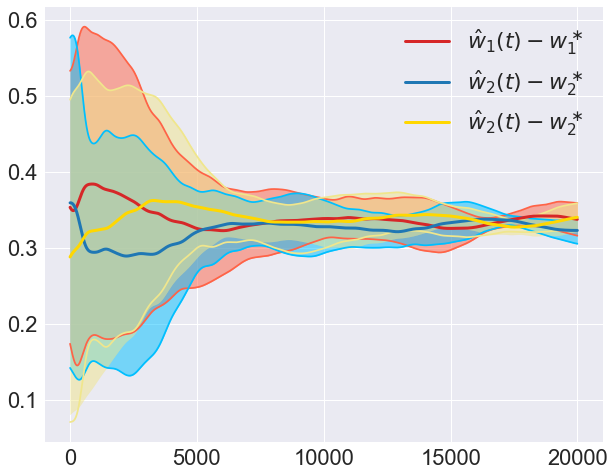

In [84]:

wmeans1=np.mean(np.asarray(cwvals1),axis=0)
wvars1=np.std(np.asarray(cwvals1),axis=0)
wmeans2=np.mean(np.asarray(cwvals2),axis=0)
wvars2=np.std(np.asarray(cwvals2),axis=0)
wmeans3=np.mean(np.asarray(cwvals3),axis=0)
wvars3=np.std(np.asarray(cwvals3),axis=0)
w1col='tomato'
plt.figure(figsize=(10,8))
#plt.plot(xmeans1, color='tab:red', linewidth=3, label=r'$\hat{x}_1(t)-x_1^\ast$')
plt.plot(wmeans1+wvars1,color=w1col) # label=r'$\pm 1$std')
plt.plot(wmeans1-wvars1,color=w1col)
plt.fill_between(np.arange(0,20000),wmeans1-wvars1,wmeans1+wvars1,color=w1col, alpha=0.5)

w2col='deepskyblue'
#plt.plot(xmeans2, color='tab:blue', linewidth=3, label=r'$\hat{x}_2(t)-x_2^\ast$')
plt.plot(wmeans2+wvars2,color=w2col)
plt.plot(wmeans2-wvars2,color=w2col)
plt.fill_between(np.arange(0,20000),wmeans2-wvars2,wmeans2+wvars2,color=w2col, alpha=0.5)

w3col='khaki'

plt.plot(wmeans3+wvars3,color=w3col)
plt.plot(wmeans3-wvars2,color=w3col)
plt.fill_between(np.arange(0,20000),wmeans3-wvars3,wmeans3+wvars3,color=w3col, alpha=0.5)

plt.plot(wmeans1, color='tab:red', linewidth=3, label=r'$\hat{w}_1(t)-w_1^\ast$')
plt.plot(wmeans2, color='tab:blue', linewidth=3, label=r'$\hat{w}_2(t)-w_2^\ast$')
plt.plot(wmeans3, color='gold', linewidth=3, label=r'$\hat{w}_2(t)-w_2^\ast$')
#plt.plot(wmeans, color='tab:orange', linewidth=3, label=r'$\hat{u}_w(t)-u_w^\ast$')
#plt.plot(wmeans+wvars,color='yellow', label=r'$\pm 1$std')
#plt.plot(wmeans-wvars,color='yellow')

#plt.fill_between(np.arange(0,20000),wmeans-wvars,wmeans+wvars,color='yellow', alpha=0.5)
plt.tick_params(labelsize=22)
plt.legend(fontsize=22)
#plt.title(r'Time Average Actions ($x$-player)', fontsize=22)
plt.savefig('timeavg_w_new.png', dpi=600, bbox_inches='tight') #,transparent=True)

## 3D Embedding

In [86]:
s3=[0.3, 0.3, 0.4, 0.2, 0.1, 0.7]
data2 = RPSTrajectory(s=s3, f=RPSderiv, numstep=10000)

X = A*(\sqrt{2}/2 w_Scissors - \sqrt{2}/2 w_Paper) +  \sqrt{2}/2 x_Scissors - \sqrt{2}/2 x_Paper

Y = A*( - (1/\sqrt{6}) w_Scissors - (1/\sqrt{6}) w_Paper + \sqrt{2}/\sqrt{3} w_Rock)

Z =  - (1/\sqrt{6}) x_Scissors - (1/\sqrt{6}) x_Paper + \sqrt{2}/\sqrt{3} x_Rock

In [87]:
import imageio
import copy

In [88]:
import os

def createFolder(directory):
    try:
        if not os.path.exists(directory):
            os.makedirs(directory)
    except OSError:
        print ('Error: Creating directory. ' +  directory)

In [90]:
max(-(1/np.sqrt(6))*data2['y3'] - (1/np.sqrt(6))*data2['y2'] + (np.sqrt(2)/np.sqrt(3))*data2['y1'])

0.11203962061117445

In [103]:
data['w3'].shape

(10000,)

In [114]:
def plot_save_fig_transform(init, f, name, inner_folder, timestep=0.1, numstep=1000, mu=0.1, A=5, show=False, save=True):
#     s0=[0.3, 0.3, 0.4, 0.2, 0.1, 0.7]
    data = RPSTrajectory(s=init, f=RPSderiv, numstep=numstep, timestep=timestep, mu=mu) 
    init_rounded = [round(x, 3) for x in init]
    X1 = A*((np.sqrt(2)/2)*data['w3'] - (np.sqrt(2)/2)*data['w2'])
    Y1 = A*( -(1/np.sqrt(6))*data['w3'] - (1/np.sqrt(6))*data['w2'] + (np.sqrt(2)/np.sqrt(3))*data['w1'])
    Z1 = np.zeros(len(data['w3']))
    X2 = (np.sqrt(2)/2)*data['y3'] - (np.sqrt(2)/2)*data['y2']
    Y2 = np.zeros(len(data['y3'])) 
    Z2 = -(1/np.sqrt(6))*data['y3'] - (1/np.sqrt(6))*data['y2'] + (np.sqrt(2)/np.sqrt(3))*data['y1']
#     print(X2, Y2, Z2)
    
    fig = make_subplots(rows=2, cols=2, column_widths=[0.5, 0.5], row_heights=[0.2, 0.8],
        specs=[[{"type": "ternary"}, {"type": "ternary"}],
               [{"type": "scene", "colspan":2}, None]])
#     go.
    fig.add_trace(go.Scatterternary(name='Initial Y', a=[init[0]], b=[init[1]], c=[init[2]], mode='markers', 
                                     marker={'symbol': 100,'color': 'green','size': 10},),row=1, col=1),
    fig.add_trace(go.Scatterternary(name='Initial W', a=[init[3]], b=[init[4]], c=[init[5]], mode='markers', 
                                     marker={'symbol': 100,'color': 'red','size': 10},),row=1, col=2),
    fig.add_trace(go.Scatter3d(x=X1, y=Y1, z=X2, mode='markers',showlegend=False,
                                  marker=dict(size=2,cmax=0.5, cmin=-0.5, color=Z2, colorscale='rainbow',colorbar=dict(
                                      title="Transformed Y2 value", thickness=20, len=0.6, y=0.35)),
                                  line=dict(color='black', width=4)),row=2, col=1)
#     traces =  [go.Scatter3d(x=X1, y=Y1, z=data[:,0], mode='markers',showlegend=False,
#                                   marker=dict(size=2,cmax=1, cmin=0, color=data[:,1], colorscale='rainbow',colorbar=dict(
#                                       title="x2 value", thickness=25, len=0.6)),
#                                   line=dict(color='black', width=4)),
#                go.Scatter(name= 'Initial X', x=[X2[0]], y=[Z2[0]], mode='markers',xaxis="x2",yaxis="y2",
#                                   marker=dict(size=10, color='maroon', colorscale='blues',symbol='circle')),
#                go.Scatter(name= 'Initial W', x=[X1[0]], y=[Y1[0]], mode='markers',xaxis="x2",yaxis="y2",
#                                   marker=dict(size=10, color='green', colorscale='blues',symbol='circle')),]
    fig.update_ternaries({
        'aaxis':{'title': 'Y1', 'min': 0.01, 'linewidth':2, 'ticks':'outside' },
        'baxis':{'title': 'Y2', 'min': 0.01, 'linewidth':2, 'ticks':'outside' },
        'caxis':{'title': 'Y3', 'min': 0.01, 'linewidth':2, 'ticks':'outside' }}, col=1)
    
    fig.update_ternaries({
        'aaxis':{'title': 'W1', 'min': 0.01, 'linewidth':2, 'ticks':'outside' },
        'baxis':{'title': 'W2', 'min': 0.01, 'linewidth':2, 'ticks':'outside' },
        'caxis':{'title': 'W3', 'min': 0.01, 'linewidth':2, 'ticks':'outside' }}, col=2)
#     'title': 'Ternary Scatter Plot',
#     'ternary':
#         {
#         'sum':1,
#         'aaxis':{'title': 'X', 'min': 0.01, 'linewidth':2, 'ticks':'outside' },
#         'baxis':{'title': 'W', 'min': 0.01, 'linewidth':2, 'ticks':'outside' },
#         'caxis':{'title': 'S', 'min': 0.01, 'linewidth':2, 'ticks':'outside' }
#     }})
    fig.update_layout(template="seaborn",
                      title='Inits:'+str(init_rounded),
                       width=900,
                       height=900,
                       autosize=False,
                       showlegend=True,
#                        xaxis = dict(domain=[0, 0.7]),
#                        xaxis2=dict(domain=[0.8, 1]),
#                        yaxis2=dict(anchor="x2"),
                       scene=dict(xaxis_title='Transformed W1',
                                  yaxis_title='Transformed W2',
                                  zaxis_title='Transformed Y1',
                                  xaxis = dict(range=[-3,3]),
#                                   xaxis2=dict(domain=[0.8, 1]),
                                  yaxis = dict(range=[-3,3],),
#                                   yaxis2=dict(anchor="x2"),
                                  zaxis = dict(range=[-0.7,0.7],),
                                  aspectratio = dict(x=1, y=1, z=0.7),
                                      aspectmode = 'manual'))
    
#         specs=[[{"type": "scattergeo", "rowspan": 2}, {"type": "bar"}],
#                [            None                    , {"type": "surface"}]])
#     fig = go.Figure(data= traces, layout=layout, )
    fig.update_yaxes(automargin=True)
    foldername = "embeddings/"+inner_folder
    filename = "embeddings/"+inner_folder+"/"+name+".png"
    if save:
        createFolder(foldername)
        fig.write_image(filename)
#     pio.to_image(fig, format="png")
    if show:
        fig.show()
    return filename

In [115]:
plot_save_fig_transform(init=[0.3, 0.3, 0.4, 0.2, 0.1, 0.7], numstep=4000, f=RPSderiv, timestep=0.1, mu=0.1, name='test', inner_folder='', show=True, save=False)

'embeddings//test.png'

```python
N=200
w1_inits = np.linspace(0.1, 1/3, N)

count=1
image_list3 = []
for i in w1_inits:
    init = [i, 2/3-i, 1/3, i, 2/3-i, 1/3]
    file_name = plot_save_fig_transform(init=init, time=1000, f=f, P=P, mu=0.1, A=5, 
                                        name=str(count), inner_folder='combined')
    print(str(count)+' done')
    image_list3.append(imageio.imread(file_name))
    count+=1
```

```python
image_list_copy = copy.deepcopy(image_list3)
img = image_list_copy + image_list_copy[::-1]
imageio.mimwrite('embeddings/combined.gif', img, fps=25)
```

In [125]:
def plot_save_fig_actual(init, f, name, inner_folder, timestep=0.1, numstep=1000, mu=0.1, A=5, show=False, save=True):
#     s0=[0.3, 0.3, 0.4, 0.2, 0.1, 0.7]
    data = RPSTrajectory(s=init, f=RPSderiv, numstep=numstep, timestep=timestep, mu=mu)  
    init_rounded = [round(x, 3) for x in init]

    fig = make_subplots(rows=2, cols=2, column_widths=[0.5, 0.5], row_heights=[0.2, 0.8],
        specs=[[{"type": "ternary"}, {"type": "ternary"}],
               [{"type": "scene", "colspan":2}, None]])

    fig.add_trace(go.Scatterternary(name='Initial Y', a=[init[0]], b=[init[1]], c=[init[2]], mode='markers', 
                                     marker={'symbol': 100,'color': 'green','size': 10},),row=1, col=1),
    fig.add_trace(go.Scatterternary(name='Initial W', a=[init[3]], b=[init[4]], c=[init[5]], mode='markers', 
                                     marker={'symbol': 100,'color': 'red','size': 10},),row=1, col=2),
    fig.add_trace(go.Scatter3d(x=data['w1'], y=data['w2'], z=data['y1'], mode='markers',showlegend=False,
                                  marker=dict(size=2,cmax=0.7, cmin=0.1, color=data['y2'], colorscale='rainbow',colorbar=dict(
                                      title="Y2", thickness=20, len=0.6, y=0.35)),
                                  line=dict(color='black', width=4)),row=2, col=1)

    fig.update_ternaries({
        'aaxis':{'title': 'Y1', 'min': 0.01, 'linewidth':2, 'ticks':'outside' },
        'baxis':{'title': 'Y2', 'min': 0.01, 'linewidth':2, 'ticks':'outside' },
        'caxis':{'title': 'Y3', 'min': 0.01, 'linewidth':2, 'ticks':'outside' }}, col=1)
    
    fig.update_ternaries({
        'aaxis':{'title': 'W1', 'min': 0.01, 'linewidth':2, 'ticks':'outside' },
        'baxis':{'title': 'W2', 'min': 0.01, 'linewidth':2, 'ticks':'outside' },
        'caxis':{'title': 'W3', 'min': 0.01, 'linewidth':2, 'ticks':'outside' }}, col=2)

    fig.update_layout(template="seaborn",
                      title='Inits:'+str(init_rounded),
                       width=900,
                       height=900,
                       autosize=False,
                       showlegend=True,
#                        xaxis = dict(domain=[0, 0.7]),
#                        xaxis2=dict(domain=[0.8, 1]),
#                        yaxis2=dict(anchor="x2"),
                       scene=dict(xaxis_title='W1',
                                  yaxis_title='W2',
                                  zaxis_title='Y1',
                                  xaxis = dict(range=[0,1]),
#                                   xaxis2=dict(domain=[0.8, 1]),
                                  yaxis = dict(range=[0,1],),
#                                   yaxis2=dict(anchor="x2"),
                                  zaxis = dict(range=[0,1],),
                                  aspectratio = dict(x=1, y=1, z=0.7),
                                      aspectmode = 'manual'))
    
#         specs=[[{"type": "scattergeo", "rowspan": 2}, {"type": "bar"}],
#                [            None                    , {"type": "surface"}]])
#     fig = go.Figure(data= traces, layout=layout, )
    fig.update_yaxes(automargin=True)
    foldername = "embeddings/"+inner_folder
    filename = "embeddings/"+inner_folder+"/"+name+".png"
    if save:
        createFolder(foldername)
        fig.write_image(filename)
#     pio.to_image(fig, format="png")
    if show:
        fig.show()
    return filename

In [127]:
plot_save_fig_actual(init=[0.1, 2/3-0.1, 1/3, 0.1, 2/3-0.1, 1/3], numstep=5000, f=RPSderiv, timestep=0.1, mu=0.1, name='test', inner_folder='', show=True, save=False)

'embeddings//test.png'

```python
N=200
w1_inits = np.linspace(0.1, 1/3, N)

count=1
image_list4 = []
for i in w1_inits:
    init = [i, 2/3-i, 1/3, i, 2/3-i, 1/3]
    file_name = plot_save_fig_actual(init=init, time=1000, f=f, P=P, mu=0.1, 
                                     A=5, name=str(count), inner_folder='combined_actual')
    print(str(count)+' done')
    image_list4.append(imageio.imread(file_name))
    count+=1
```

```python
image_list_copy = copy.deepcopy(image_list4)
img = image_list_copy + image_list_copy[::-1]
imageio.mimwrite('embeddings/combined_actual.gif', img, fps=25)
```